# Welcome

This is an attempt to predict whether or not an individual will suffer a stroke.

In [1]:
import numpy as np 
import pandas as pd 
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.gridspec as grid_spec
import seaborn as sns
from imblearn.over_sampling import SMOTE
import scikitplot as skplt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.tree import DecisionTreeRegressor,DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, recall_score, roc_auc_score, precision_score, f1_score
import warnings
warnings.filterwarnings('ignore')

/kaggle/input/stroke-prediction-dataset/healthcare-dataset-stroke-data.csv


In [2]:
df = pd.read_csv('healthcare-dataset-stroke-data.csv')
df.head(3)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1


# Missing Data

In [3]:
df.isnull().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [4]:
#Below are 3 imputers we tried individually to impute the missing values of BMI since it's potentially an imporant feature. 
#Run either one of these 3 imputers during one execution. 
#We found that DecisionTreeRegressor works best so we have left that uncommented.
DT_bmi_pipe = Pipeline( steps=[ 
                               ('scale',StandardScaler()),
                               ('lr',DecisionTreeRegressor(random_state=42))
                              ])
X = df[['age','gender','bmi']].copy()
X.gender = X.gender.replace({'Male':0,'Female':1,'Other':-1}).astype(np.uint8)

Missing = X[X.bmi.isna()]
X = X[~X.bmi.isna()]
Y = X.pop('bmi')
DT_bmi_pipe.fit(X,Y)
predicted_bmi = pd.Series(DT_bmi_pipe.predict(Missing[['age','gender']]),index=Missing.index)
df.loc[Missing.index,'bmi'] = predicted_bmi


In [5]:
"""
from sklearn.neighbors import KNeighborsRegressor
DT_bmi_pipe = Pipeline( steps=[ 
                               ('scale',StandardScaler()),
                               ('lr',KNeighborsRegressor(n_neighbors=5))
                              ])
X = df[['age','gender','bmi']].copy()
X.gender = X.gender.replace({'Male':0,'Female':1,'Other':-1}).astype(np.uint8)

Missing = X[X.bmi.isna()]
X = X[~X.bmi.isna()]
Y = X.pop('bmi')
DT_bmi_pipe.fit(X,Y)
predicted_bmi = pd.Series(DT_bmi_pipe.predict(Missing[['age','gender']]),index=Missing.index)
df.loc[Missing.index,'bmi'] = predicted_bmi
"""

"\nfrom sklearn.neighbors import KNeighborsRegressor\nDT_bmi_pipe = Pipeline( steps=[ \n                               ('scale',StandardScaler()),\n                               ('lr',KNeighborsRegressor(n_neighbors=5))\n                              ])\nX = df[['age','gender','bmi']].copy()\nX.gender = X.gender.replace({'Male':0,'Female':1,'Other':-1}).astype(np.uint8)\n\nMissing = X[X.bmi.isna()]\nX = X[~X.bmi.isna()]\nY = X.pop('bmi')\nDT_bmi_pipe.fit(X,Y)\npredicted_bmi = pd.Series(DT_bmi_pipe.predict(Missing[['age','gender']]),index=Missing.index)\ndf.loc[Missing.index,'bmi'] = predicted_bmi\n"

In [6]:
"""
df.bmi.replace(to_replace=np.nan, value=df.bmi.median(), inplace=True)
"""

'\ndf.bmi.replace(to_replace=np.nan, value=df.bmi.median(), inplace=True)\n'

In [7]:
print('Missing values: ',sum(df.isnull().sum()))

Missing values:  0


# Exploring the data

In [8]:
variables = [variable for variable in df.columns if variable not in ['id','stroke']]

conts = ['age','avg_glucose_level','bmi']

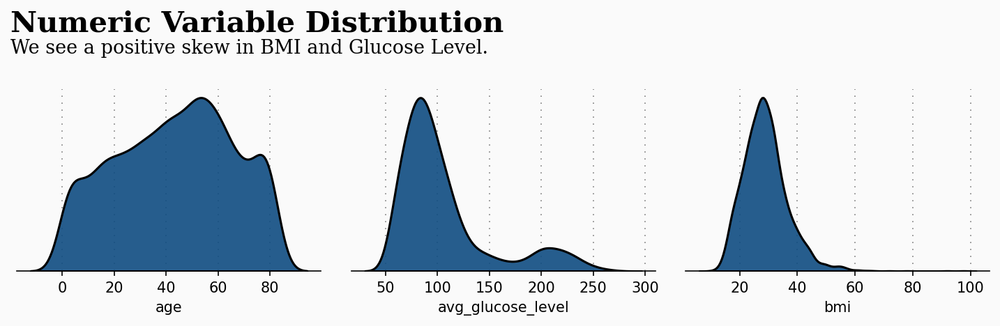

In [9]:
fig = plt.figure(figsize=(12, 12), dpi=150, facecolor='#fafafa')
gs = fig.add_gridspec(4, 3)
gs.update(wspace=0.1, hspace=0.4)

background_color = "#fafafa"

plot = 0
for row in range(0, 1):
    for col in range(0, 3):
        locals()["ax"+str(plot)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(plot)].set_facecolor(background_color)
        locals()["ax"+str(plot)].tick_params(axis='y', left=False)
        locals()["ax"+str(plot)].get_yaxis().set_visible(False)
        for s in ["top","right","left"]:
            locals()["ax"+str(plot)].spines[s].set_visible(False)
        plot += 1

plot = 0
for variable in conts:
        sns.kdeplot(df[variable] ,ax=locals()["ax"+str(plot)], color='#0f4c81', shade=True, linewidth=1.5, ec='black',alpha=0.9, zorder=3, legend=False)
        locals()["ax"+str(plot)].grid(which='major', axis='x', zorder=0, color='gray', linestyle=':', dashes=(1,5))
        locals()["ax"+str(plot)].set_xlabel(variable)
        plot += 1
        
ax0.text(-20, 0.022, 'Numeric Variable Distribution', fontsize=20, fontweight='bold', fontfamily='serif')
ax0.text(-20, 0.02, 'We see a positive skew in BMI and Glucose Level.', fontsize=13, fontweight='light', fontfamily='serif')

plt.show()

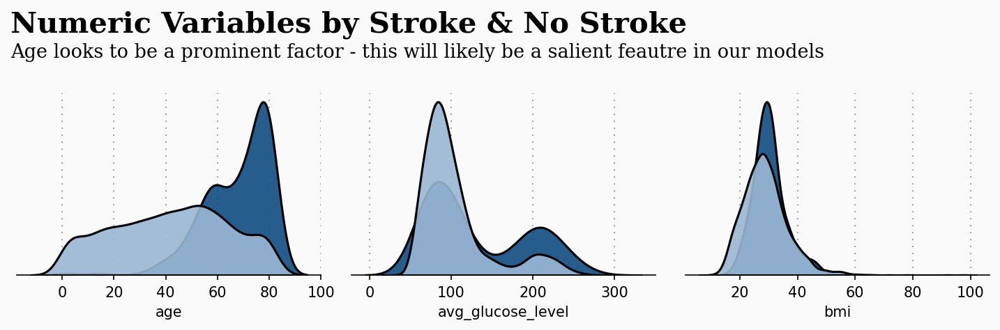

In [10]:
fig = plt.figure(figsize=(12, 12), dpi=150,facecolor=background_color)
gs = fig.add_gridspec(4, 3)
gs.update(wspace=0.1, hspace=0.4)


plot = 0
for row in range(0, 1):
    for col in range(0, 3):
        locals()["ax"+str(plot)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(plot)].set_facecolor(background_color)
        locals()["ax"+str(plot)].tick_params(axis='y', left=False)
        locals()["ax"+str(plot)].get_yaxis().set_visible(False)
        for s in ["top","right","left"]:
            locals()["ax"+str(plot)].spines[s].set_visible(False)
        plot += 1

plot = 0

s = df[df['stroke'] == 1]
ns = df[df['stroke'] == 0]

for feature in conts:
        sns.kdeplot(s[feature], ax=locals()["ax"+str(plot)], color='#0f4c81', shade=True, linewidth=1.5, ec='black',alpha=0.9, zorder=3, legend=False)
        sns.kdeplot(ns[feature],ax=locals()["ax"+str(plot)], color='#9bb7d4', shade=True, linewidth=1.5, ec='black',alpha=0.9, zorder=3, legend=False)
        locals()["ax"+str(plot)].grid(which='major', axis='x', zorder=0, color='gray', linestyle=':', dashes=(1,5))
        locals()["ax"+str(plot)].set_xlabel(feature)
        plot += 1
        
ax0.text(-20, 0.056, 'Numeric Variables by Stroke & No Stroke', fontsize=20, fontweight='bold', fontfamily='serif')
ax0.text(-20, 0.05, 'Age looks to be a prominent factor - this will likely be a salient feautre in our models', 
         fontsize=13, fontweight='light', fontfamily='serif')

plt.show()


# Insight

Based on the above plots, it seems clear that Age is a big factor in stroke patients - the older you get the more at risk you are.

Though less obvious, there are also differences in Avg. Glucose Levels and BMI.

Let's explore those variables further...



In [11]:
str_only = df[df['stroke'] == 1]
no_str_only = df[df['stroke'] == 0]

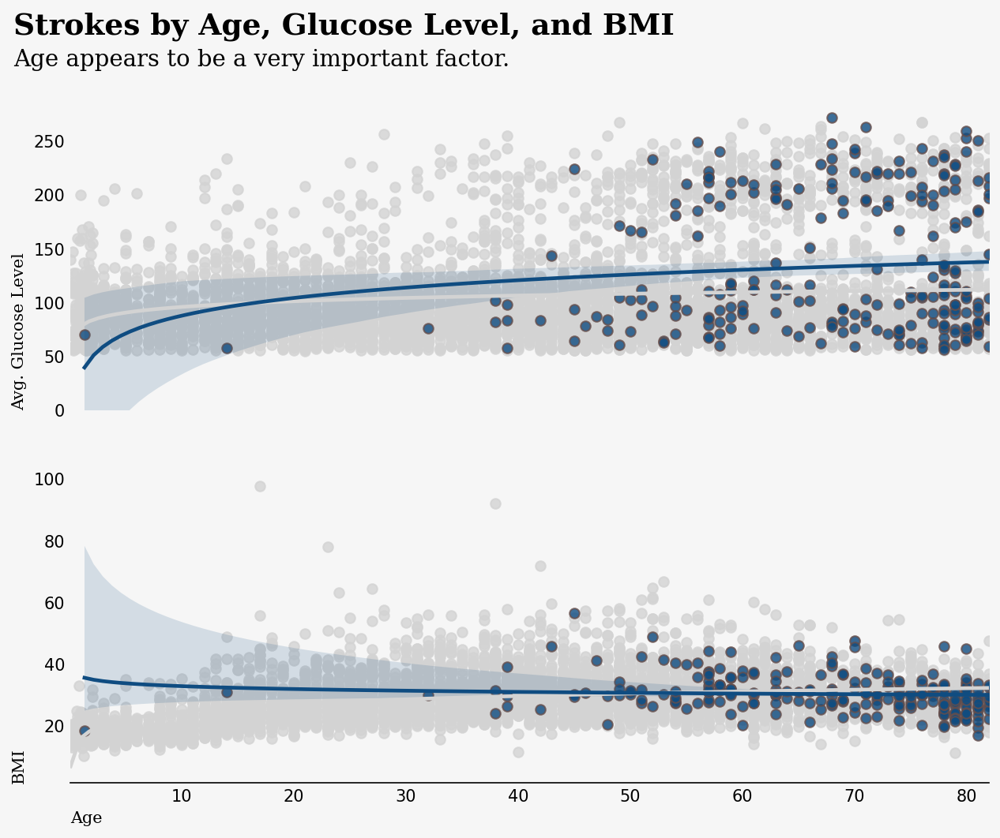

In [12]:
# Setting up figure and axes

background_color = "#f6f6f6"

fig = plt.figure(figsize=(10,16),dpi=150,facecolor='#f6f6f6') # create figure
gs = fig.add_gridspec(4, 2)
gs.update(wspace=0.5, hspace=0.2)
ax0 = fig.add_subplot(gs[0, 0:2])
ax1 = fig.add_subplot(gs[1, 0:2]) # create axes

ax0.set_facecolor(background_color)
ax1.set_facecolor(background_color)

# glucose

sns.regplot(no_str_only['age'],y=no_str_only['avg_glucose_level'],  
            color='lightgray',
            logx=True,
            ax=ax0)

sns.regplot(str_only['age'],y=str_only['avg_glucose_level'],  
            color='#0f4c81',
            logx=True,scatter_kws={'edgecolors':['#664e4b'], 
                                              'linewidth': 1},
            ax=ax0)

ax0.set(ylim=(0, None))
ax0.set_xlabel(" ",fontsize=12,fontfamily='serif')
ax0.set_ylabel("Avg. Glucose Level",fontsize=10,fontfamily='serif',loc='bottom')

ax0.tick_params(axis='x', bottom=False)
ax0.get_xaxis().set_visible(False)

for s in ['top','left','bottom']:
    ax0.spines[s].set_visible(False)


# bmi
sns.regplot(no_str_only['age'],y=no_str_only['bmi'],  
            color='lightgray',
            logx=True,
            ax=ax1)

sns.regplot(str_only['age'],y=str_only['bmi'],  
            color='#0f4c81', scatter_kws={'edgecolors':['#664e4b'], 
                                              'linewidth': 1},
            logx=True,
            ax=ax1)

ax1.set_xlabel("Age",fontsize=10,fontfamily='serif',loc='left')
ax1.set_ylabel("BMI",fontsize=10,fontfamily='serif',loc='bottom')


for s in ['top','left','right']:
    ax0.spines[s].set_visible(False)
    ax1.spines[s].set_visible(False)

    
ax0.text(-5,350,'Strokes by Age, Glucose Level, and BMI',fontsize=18,fontfamily='serif',fontweight='bold')
ax0.text(-5,320,'Age appears to be a very important factor.',fontsize=14,fontfamily='serif')


ax0.tick_params(axis=u'both', which=u'both',length=0)
ax1.tick_params(axis=u'both', which=u'both',length=0)



plt.show()

In [13]:
# Dropping single other gender

no_str_only = no_str_only[(no_str_only['gender'] != 'Other')]

no_str_only.gender.value_counts()

Female    2853
Male      2007
Name: gender, dtype: int64

In [14]:
positive = pd.DataFrame(str_only["work_type"].value_counts())
positive["Percentage"] = positive["work_type"].apply(lambda x: x/sum(positive["work_type"])*100)
positive = positive.sort_index()

negative = pd.DataFrame(no_str_only["work_type"].value_counts())
negative["Percentage"] = negative["work_type"].apply(lambda x: x/sum(negative["work_type"])*100)
negative = negative.sort_index()

ax0.bar(np.arange(len(positive.index)), height=positive["Percentage"], zorder=3, color="gray", width=0.05)
ax0.scatter(np.arange(len(positive.index)), positive["Percentage"], zorder=3,s=200, color="gray")
ax0.bar(np.arange(len(negative.index))+0.4, height=negative["Percentage"], zorder=3, color="#0e4f66", width=0.05)
ax0.scatter(np.arange(len(negative.index))+0.4, negative["Percentage"], zorder=3,s=200, color="#0e4f66")


# General Overview

In [15]:
# Encoding categorical values

df['gender'] = df['gender'].replace({'Male':0,'Female':1,'Other':-1}).astype(np.uint8)
df['Residence_type'] = df['Residence_type'].replace({'Rural':0,'Urban':1}).astype(np.uint8)
df['work_type'] = df['work_type'].replace({'Private':0,'Self-employed':1,'Govt_job':2,'children':-1,'Never_worked':-2}).astype(np.uint8)

# Modelling

# Can we predict whether or not an indiviudal will suffer a stroke?

We use Synthetic Minority Over-sampling Technique to balance our dataset.

In [16]:
df['stroke'].value_counts()

0    4861
1     249
Name: stroke, dtype: int64

# Baseline

For such an imbalanced dataset, a useful baseline can be to beat the 'Null Accuracy', and in our case, since we're looking for the positive ('stroke'), I will take the inverse of that.
In other words, always predicting the most common outcome. 

For this case, 4861/(249+4861) = 0.9512720156555773 is the accuracy

In [17]:
X  = df[['gender','age','hypertension','heart_disease','work_type','avg_glucose_level','bmi']]
y = df['stroke']

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=42)

In [18]:
X_test.head(2)

,gender,age,hypertension,heart_disease,work_type,avg_glucose_level,bmi
4688,0,31.0,0,0,1,64.85,23.0
4478,0,40.0,0,0,1,65.29,28.3


In [19]:
#Fixing biased data with SMOTE

oversample = SMOTE()
X_train_resh, y_train_resh = oversample.fit_resample(X_train, y_train.ravel())


# Models 

I will model Random Forest, SVM, and Logisitc Regression for this classificatioin task. 

In addition, I will utilise 10 fold cross validation.

In [20]:
# Models

# Scale our data in pipeline, then split

rf_pipeline = Pipeline(steps = [('scale',StandardScaler()),('RF',RandomForestClassifier(random_state=42))])
svm_pipeline = Pipeline(steps = [('scale',StandardScaler()),('SVM',SVC(random_state=42))])
logreg_pipeline = Pipeline(steps = [('scale',StandardScaler()),('LR',LogisticRegression(random_state=42))])



In [21]:
rf_cv = cross_val_score(rf_pipeline,X_train_resh,y_train_resh,cv=10,scoring='f1')
svm_cv = cross_val_score(svm_pipeline,X_train_resh,y_train_resh,cv=10,scoring='f1')
logreg_cv = cross_val_score(logreg_pipeline,X_train_resh,y_train_resh,cv=10,scoring='f1')

In [22]:
print('Mean f1 scores:')
print('Random Forest mean :',cross_val_score(rf_pipeline,X_train_resh,y_train_resh,cv=10,scoring='f1').mean())
print('SVM mean :',cross_val_score(svm_pipeline,X_train_resh,y_train_resh,cv=10,scoring='f1').mean())
print('Logistic Regression mean :',cross_val_score(logreg_pipeline,X_train_resh,y_train_resh,cv=10,scoring='f1').mean())



Mean f1 scores:
Random Forest mean : 0.9383565871530226
SVM mean : 0.8389362968229864
Logistic Regression mean : 0.805972748319259


# Random Forest performed the best on training data


# Now, trying it on the unseen negative data


In [23]:
rf_pipeline.fit(X_train_resh,y_train_resh)
svm_pipeline.fit(X_train_resh,y_train_resh)
logreg_pipeline.fit(X_train_resh,y_train_resh)

#X = df.loc[:,X.columns]
#Y = df.loc[:,'stroke']

rf_pred   =rf_pipeline.predict(X_test)
svm_pred  = svm_pipeline.predict(X_test)
logreg_pred   = logreg_pipeline.predict(X_test)

rf_cm  = confusion_matrix(y_test,rf_pred )
svm_cm = confusion_matrix(y_test,svm_pred)
logreg_cm  = confusion_matrix(y_test,logreg_pred )

rf_f1  = f1_score(y_test,rf_pred)
svm_f1 = f1_score(y_test,svm_pred)
logreg_f1  = f1_score(y_test,logreg_pred)

In [24]:
print('Mean f1 scores:')

print('RF mean :',rf_f1)
print('SVM mean :',svm_f1)
print('LR mean :',logreg_f1)

Mean f1 scores:
RF mean : 0.24299065420560745
SVM mean : 0.2385321100917431
LR mean : 0.24946236559139787


In [25]:
from sklearn.metrics import plot_confusion_matrix, classification_report

print(classification_report(y_test,rf_pred))

print('Accuracy Score: ',accuracy_score(y_test,rf_pred))

              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1444
           1       0.21      0.29      0.24        89

    accuracy                           0.89      1533
   macro avg       0.58      0.61      0.59      1533
weighted avg       0.91      0.89      0.90      1533

Accuracy Score:  0.8943248532289628


In [26]:
from sklearn.metrics import plot_confusion_matrix, classification_report

print(classification_report(y_test,logreg_pred))

print('Accuracy Score: ',accuracy_score(y_test,logreg_pred))

              precision    recall  f1-score   support

           0       0.97      0.78      0.87      1444
           1       0.15      0.65      0.25        89

    accuracy                           0.77      1533
   macro avg       0.56      0.72      0.56      1533
weighted avg       0.93      0.77      0.83      1533

Accuracy Score:  0.7723418134377038


In [27]:
from sklearn.metrics import plot_confusion_matrix, classification_report

print(classification_report(y_test,svm_pred))

print('Accuracy Score: ',accuracy_score(y_test,svm_pred))

              precision    recall  f1-score   support

           0       0.97      0.80      0.87      1444
           1       0.15      0.58      0.24        89

    accuracy                           0.78      1533
   macro avg       0.56      0.69      0.56      1533
weighted avg       0.92      0.78      0.84      1533

Accuracy Score:  0.7834311806914547


# Good accuracy, poor recall

In [28]:
# Parameters received after gridsearchcv hyperparameter tuning on a different notebook
rfc = Pipeline(steps = [('scale',StandardScaler()),('LR',RandomForestClassifier(max_features=3,n_estimators=175,bootstrap=False,criterion='gini'))])

rfc.fit(X_train_resh,y_train_resh)

rfc_tuned_pred = rfc.predict(X_test)

In [29]:
print(classification_report(y_test,rfc_tuned_pred))

print('Accuracy Score: ',accuracy_score(y_test,rfc_tuned_pred))
print('F1 Score: ',f1_score(y_test,rfc_tuned_pred))

              precision    recall  f1-score   support

           0       0.95      0.94      0.95      1444
           1       0.21      0.24      0.22        89

    accuracy                           0.90      1533
   macro avg       0.58      0.59      0.58      1533
weighted avg       0.91      0.90      0.91      1533

Accuracy Score:  0.9028049575994781
F1 Score:  0.2198952879581152


#  Logistic Regression

Logistic Regression had the highest f1 score above, so perhaps we can tune that for better results.

In [30]:
# Let's use those params now


logreg_pipeline = Pipeline(steps = [('scale',StandardScaler()),('LR',LogisticRegression(C=0.005,penalty='l1',random_state=42, solver='liblinear'))])
logreg_pipeline.fit(X_train_resh,y_train_resh)


logreg_tuned_pred   = logreg_pipeline.predict(X_test)


In [31]:
print(classification_report(y_test,logreg_tuned_pred))

print('Accuracy Score: ',accuracy_score(y_test,logreg_tuned_pred))
print('F1 Score: ',f1_score(y_test,logreg_tuned_pred))

              precision    recall  f1-score   support

           0       0.98      0.72      0.83      1444
           1       0.14      0.76      0.24        89

    accuracy                           0.72      1533
   macro avg       0.56      0.74      0.53      1533
weighted avg       0.93      0.72      0.79      1533

Accuracy Score:  0.7195042400521853
F1 Score:  0.2402826855123675


So the hyper-parameter tuning has helped the Logisitc Regression model. It's recall score is much better than Random Forest's - even if the overall acuracy is down.

However, we can maniupulate the threshold that our model uses to classify stroke vs no-stroke.

Let's try that...

In [32]:

from sklearn.preprocessing import binarize

for i in range(1,6):
    
    cm1=0
    y_pred1 = logreg_pipeline.predict_proba(X_test)[:,1]
    y_pred1 = y_pred1.reshape(-1,1)
    y_pred2 = binarize(y_pred1, i/10)
    y_pred2 = np.where(y_pred2 == 1, 1, 0)
    cm1 = confusion_matrix(y_test, y_pred2)
        
    print ('With',i/10,'threshold the Confusion Matrix is ','\n\n',cm1,'\n\n',
            'with',cm1[0,0]+cm1[1,1],'correct predictions, ', '\n\n', 
           
            cm1[0,1],'Type I errors( False Positives), ','\n\n',
           
            cm1[1,0],'Type II errors( False Negatives), ','\n\n',
           
           'Accuracy score: ', (accuracy_score(y_test, y_pred2)), '\n\n',
           'F1 score: ', (f1_score(y_test, y_pred2)), '\n\n',
           'Sensitivity: ',cm1[1,1]/(float(cm1[1,1]+cm1[1,0])), '\n\n',
           
           'Specificity: ',cm1[0,0]/(float(cm1[0,0]+cm1[0,1])),'\n\n',
          
            '====================================================', '\n\n')

With 0.1 threshold the Confusion Matrix is  

 [[ 367 1077]
 [   0   89]] 

 with 456 correct predictions,  

 1077 Type I errors( False Positives),  

 0 Type II errors( False Negatives),  

 Accuracy score:  0.2974559686888454 

 F1 score:  0.14183266932270916 

 Sensitivity:  1.0 

 Specificity:  0.25415512465373963 



With 0.2 threshold the Confusion Matrix is  

 [[588 856]
 [  2  87]] 

 with 675 correct predictions,  

 856 Type I errors( False Positives),  

 2 Type II errors( False Negatives),  

 Accuracy score:  0.44031311154598823 

 F1 score:  0.1686046511627907 

 Sensitivity:  0.9775280898876404 

 Specificity:  0.407202216066482 



With 0.3 threshold the Confusion Matrix is  

 [[752 692]
 [  5  84]] 

 with 836 correct predictions,  

 692 Type I errors( False Positives),  

 5 Type II errors( False Negatives),  

 Accuracy score:  0.5453359425962165 

 F1 score:  0.19421965317919077 

 Sensitivity:  0.9438202247191011 

 Specificity:  0.5207756232686981 



With 0.4

One can see how, by manipulating the threshold, we can catch more strokes. 

F1 score is a decent starting point for this as it is the weighted average of several metrics.



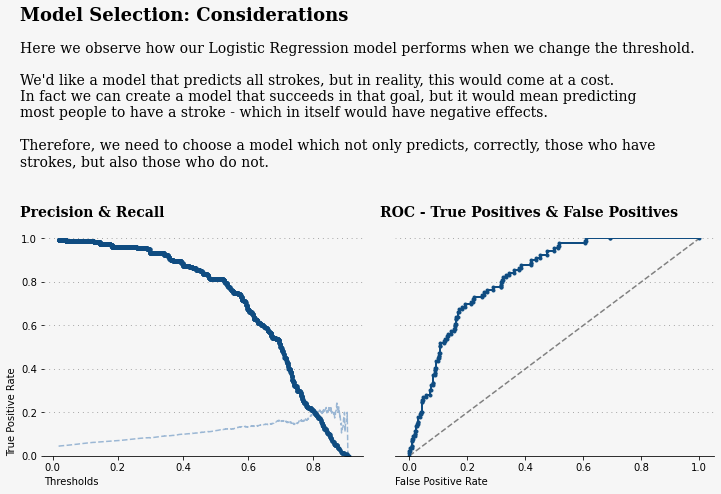

In [33]:

from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve

ns_probs = [0 for _ in range(len(y_test))]
lr_probs = logreg_pipeline.predict_proba(X_test)
lr_probs = lr_probs[:, 1]
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)



y_scores = logreg_pipeline.predict_proba(X_train)[:,1]
precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)



# Plots

fig = plt.figure(figsize=(12,4))
gs = fig.add_gridspec(1,2, wspace=0.1,hspace=0)
ax = gs.subplots()

background_color = "#f6f6f6"
fig.patch.set_facecolor(background_color) # figure background color
ax[0].set_facecolor(background_color) 
ax[1].set_facecolor(background_color)

ax[0].grid(color='gray', linestyle=':', axis='y', zorder=0,  dashes=(1,5))
ax[1].grid(color='gray', linestyle=':', axis='y',  dashes=(1,5))



y_scores = logreg_pipeline.predict_proba(X_train)[:,1]


precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)

ax[0].plot(thresholds, precisions[:-1], 'b--', label='Precision',color='#9bb7d4')
ax[0].plot(thresholds, recalls[:-1], '.', linewidth=1,label='Recall',color='#0f4c81')
ax[0].set_ylabel('True Positive Rate',loc='bottom')
ax[0].set_xlabel('Thresholds',loc='left')
#plt.legend(loc='center left')
ax[0].set_ylim([0,1])


# plot the roc curve for the model
ax[1].plot(ns_fpr, ns_tpr, linestyle='--', label='Dummy Classifer',color='gray')
ax[1].plot(lr_fpr, lr_tpr, marker='.', linewidth=2,color='#0f4c81')
ax[1].set_xlabel('False Positive Rate',loc='left')
ax[1].set_ylabel('')
ax[1].set_ylim([0,1])

for s in ["top","right","left"]:
    ax[0].spines[s].set_visible(False)
    ax[1].spines[s].set_visible(False)
    
    
ax[0].text(-0.1,2,'Model Selection: Considerations',fontsize=18,fontfamily='serif',fontweight='bold')
ax[0].text(-0.1,1.26,
'''
Here we observe how our Logistic Regression model performs when we change the threshold.

We'd like a model that predicts all strokes, but in reality, this would come at a cost.
In fact we can create a model that succeeds in that goal, but it would mean predicting
most people to have a stroke - which in itself would have negative effects.

Therefore, we need to choose a model which not only predicts, correctly, those who have
strokes, but also those who do not.
''',fontsize=14,fontfamily='serif')


ax[0].text(-0.1,1.1,'Precision & Recall',fontsize=14,fontfamily='serif',fontweight='bold')
ax[1].text(-0.1,1.1,'ROC - True Positives & False Positives',fontsize=14,fontfamily='serif',fontweight='bold')

ax[1].tick_params(axis='y', colors=background_color)

plt.show()

# For completeness, I will try to optimize SVM also

In [34]:
# Let's use those params now

svm_pipeline = Pipeline(steps = [('scale',StandardScaler()),('SVM',SVC(C=1000,gamma=0.01,kernel='rbf',random_state=42))])

svm_pipeline.fit(X_train_resh,y_train_resh)


svm_tuned_pred   = svm_pipeline.predict(X_test)


In [35]:
print(classification_report(y_test,svm_tuned_pred))

print('Accuracy Score: ',accuracy_score(y_test,svm_tuned_pred))
print('F1 Score: ',f1_score(y_test,svm_tuned_pred))

              precision    recall  f1-score   support

           0       0.97      0.78      0.86      1444
           1       0.15      0.62      0.24        89

    accuracy                           0.77      1533
   macro avg       0.56      0.70      0.55      1533
weighted avg       0.92      0.77      0.83      1533

Accuracy Score:  0.7671232876712328
F1 Score:  0.2355460385438972


# Below is the RoC curve of the tuned models with the best hyperparameters

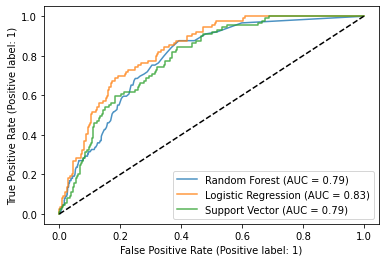

In [36]:
from sklearn.metrics import plot_roc_curve

# Let's use those params now
#{'bootstrap': False, 'criterion': 'entropy', 'max_features': 3, 'n_estimators': 100}
rfc = Pipeline(steps = [('scale',StandardScaler()),('RF',RandomForestClassifier(max_features=3,n_estimators=175,bootstrap=False,criterion='gini'))])

rfc.fit(X_train_resh,y_train_resh)

rfc_tuned_pred = rfc.predict(X_test)
ax = plt.gca()
rfc_disp = plot_roc_curve(rfc, X_test, y_test, ax=ax, alpha=0.8,name="Random Forest")
lrc = Pipeline(steps = [('scale',StandardScaler()),('LR',LogisticRegression(C=0.005,penalty='l1',random_state=42, solver='liblinear'))])
lrc.fit(X_train_resh,y_train_resh)
lrc_tuned_pred = lrc.predict(X_test)
lrc_disp = plot_roc_curve(lrc, X_test, y_test, ax=ax, alpha=0.8,name="Logistic Regression")
svc = Pipeline(steps = [('scale',StandardScaler()),('SV',SVC(C=1000,gamma=0.01,kernel='rbf',random_state=42))])
svc.fit(X_train_resh,y_train_resh)
svc_tuned_pred = rfc.predict(X_test)
svc_disp = plot_roc_curve(svc, X_test, y_test, ax=ax, alpha=0.8,name="Support Vector")
plt.plot([0, 1], [0, 1], 'k--')
plt.show()
#DecisionTree


# Decision Time

For reasons mentioned in the report, the model is better off predicting those who will suffer a stroke, rather than predicting who will not. 



In [37]:
# Make dataframes to plot

rf_df = pd.DataFrame(data=[f1_score(y_test,rf_pred),accuracy_score(y_test, rf_pred), recall_score(y_test, rf_pred),
                   precision_score(y_test, rf_pred)], 
             columns=['Random Forest Score'],
             index=["F1","Accuracy", "Recall", "Precision"])

svm_df = pd.DataFrame(data=[f1_score(y_test,svm_pred),accuracy_score(y_test, svm_pred), recall_score(y_test, svm_pred),
                   precision_score(y_test, svm_pred)], 
             columns=['Support Vector Machine (SVM) Score'],
             index=["F1","Accuracy", "Recall", "Precision"])

lr_df = pd.DataFrame(data=[f1_score(y_test,logreg_tuned_pred),accuracy_score(y_test, logreg_tuned_pred), recall_score(y_test, logreg_tuned_pred),
                   precision_score(y_test, logreg_tuned_pred)], 
             columns=['Tuned Logistic Regression Score'],
             index=["F1","Accuracy", "Recall", "Precision"])



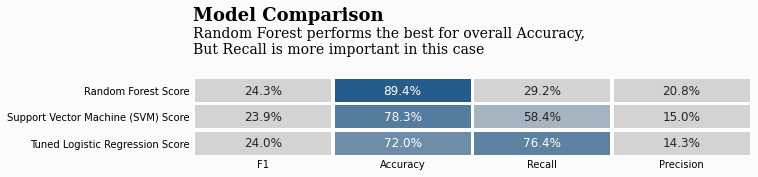

In [38]:
df_models = round(pd.concat([rf_df,svm_df,lr_df], axis=1),3)
import matplotlib
colors = ["lightgray","lightgray","#0f4c81"]
colormap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)

background_color = "#fbfbfb"

fig = plt.figure(figsize=(10,8)) # create figure
gs = fig.add_gridspec(4, 2)
gs.update(wspace=0.1, hspace=0.5)
ax0 = fig.add_subplot(gs[0, :])

sns.heatmap(df_models.T, cmap=colormap,annot=True,fmt=".1%",vmin=0,vmax=0.95, linewidths=2.5,cbar=False,ax=ax0,annot_kws={"fontsize":12})
fig.patch.set_facecolor(background_color) # figure background color
ax0.set_facecolor(background_color) 

ax0.text(0,-2.15,'Model Comparison',fontsize=18,fontweight='bold',fontfamily='serif')
ax0.text(0,-0.9,'Random Forest performs the best for overall Accuracy,\nBut Recall is more important in this case',fontsize=14,fontfamily='serif')
ax0.tick_params(axis=u'both', which=u'both',length=0)


plt.show()

# Model by Model Confusion Matrix





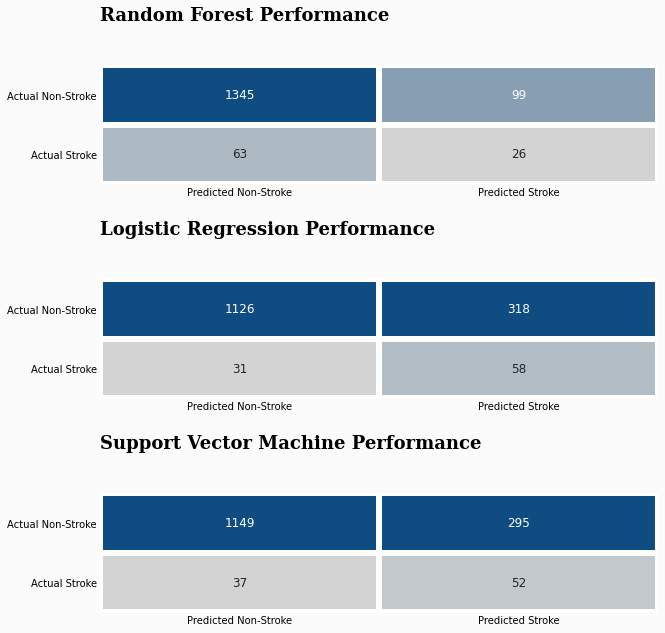

In [39]:

# Plotting our results

colors = ["lightgray","#0f4c81","#0f4c81","#0f4c81","#0f4c81","#0f4c81","#0f4c81","#0f4c81"]
colormap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)


background_color = "#fbfbfb"

fig = plt.figure(figsize=(10,14)) # create figure
gs = fig.add_gridspec(4, 2)
gs.update(wspace=0.1, hspace=0.8)
ax0 = fig.add_subplot(gs[0, :])
ax1 = fig.add_subplot(gs[1, :])
ax2 = fig.add_subplot(gs[2, :])
ax0.set_facecolor(background_color) # axes background color

# Overall
sns.heatmap(rf_cm, cmap=colormap,annot=True,fmt="d", linewidths=5,cbar=False,ax=ax0,
            yticklabels=['Actual Non-Stroke','Actual Stroke'],xticklabels=['Predicted Non-Stroke','Predicted Stroke'],annot_kws={"fontsize":12})

sns.heatmap(logreg_cm, cmap=colormap,annot=True,fmt="d", linewidths=5,cbar=False,ax=ax1,
            yticklabels=['Actual Non-Stroke','Actual Stroke'],xticklabels=['Predicted Non-Stroke','Predicted Stroke'],annot_kws={"fontsize":12})

sns.heatmap(svm_cm, cmap=colormap,annot=True,fmt="d", linewidths=5,cbar=False,ax=ax2,
            yticklabels=['Actual Non-Stroke','Actual Stroke'],xticklabels=['Predicted Non-Stroke','Predicted Stroke'],annot_kws={"fontsize":12})



ax0.tick_params(axis=u'both', which=u'both',length=0)
background_color = "#fbfbfb"
fig.patch.set_facecolor(background_color) # figure background color
ax0.set_facecolor(background_color) 
ax1.tick_params(axis=u'both', which=u'both',length=0)
ax1.set_facecolor(background_color) 
ax2.tick_params(axis=u'both', which=u'both',length=0)
ax2.set_facecolor(background_color)

ax0.text(0,-0.75,'Random Forest Performance',fontsize=18,fontweight='bold',fontfamily='serif')

ax1.text(0,-0.75,'Logistic Regression Performance',fontsize=18,fontweight='bold',fontfamily='serif')

ax2.text(0,-0.75,'Support Vector Machine Performance',fontsize=18,fontweight='bold',fontfamily='serif')


plt.show()

# Selection

We would opt for Logistic Regression. 

It Has a decent accuracy, and the best recall. I feel that on balance it provides the best overall results.

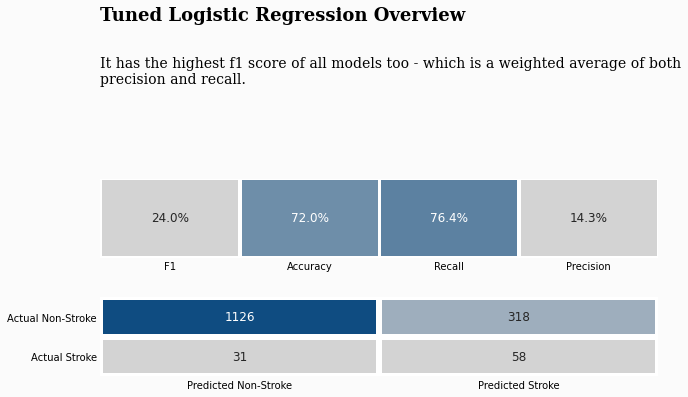

In [40]:
colors = ["lightgray","lightgray","#0f4c81"]
colormap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)

background_color = "#fbfbfb"

fig = plt.figure(figsize=(10,8)) # create figure
gs = fig.add_gridspec(4, 2)
gs.update(wspace=0.1, hspace=0.5)
ax0 = fig.add_subplot(gs[0, :])
ax1 = fig.add_subplot(gs[1, :])

sns.heatmap(lr_df.T, cmap=colormap,annot=True,fmt=".1%",vmin=0,vmax=0.95,yticklabels='', linewidths=2.5,cbar=False,ax=ax0,annot_kws={"fontsize":12})
fig.patch.set_facecolor(background_color) # figure background color
ax0.set_facecolor(background_color) 
ax1.set_facecolor(background_color) 

ax0.text(0,-2,'Tuned Logistic Regression Overview',fontsize=18,fontweight='bold',fontfamily='serif')
ax0.text(0,-1,
'''
It has the highest f1 score of all models too - which is a weighted average of both
precision and recall.
''',fontsize=14,fontfamily='serif')
ax0.tick_params(axis=u'both', which=u'both',length=0)



# Overall

sns.heatmap(logreg_cm, cmap=colormap,annot=True,fmt="d", linewidths=5,cbar=False,ax=ax1,
            yticklabels=['Actual Non-Stroke','Actual Stroke'],vmax=500,vmin=0,xticklabels=['Predicted Non-Stroke','Predicted Stroke'],annot_kws={"fontsize":12})
ax0.tick_params(axis=u'both', which=u'both',length=0)
ax1.tick_params(axis=u'both', which=u'both',length=0)
plt.show()

# Model Interpretation

We'll use some valuable tools which help to uncover the supposed "Black Box" of machine learning algorithms.


# Bonus: Dive in to Random Forest's performance

As the model with the highest 'accuracy' (not the best metric for this project), I thought I would include a little more analysis so we can see how the Random Forest makes its predictions.

In [41]:

def rf_feat_importance(m, df):
    return pd.DataFrame({'Feature':df.columns, 'Importance':m.feature_importances_}).sort_values('Importance', ascending=False)


fi = rf_feat_importance(rf_pipeline['RF'], X)
fi[:10].style.background_gradient(cmap=colormap)

,Feature,Importance
1,age,0.459645
5,avg_glucose_level,0.213947
6,bmi,0.170711
4,work_type,0.081495
0,gender,0.048401
2,hypertension,0.013449
3,heart_disease,0.012353


Let's plot this with the top 3 features highlighted

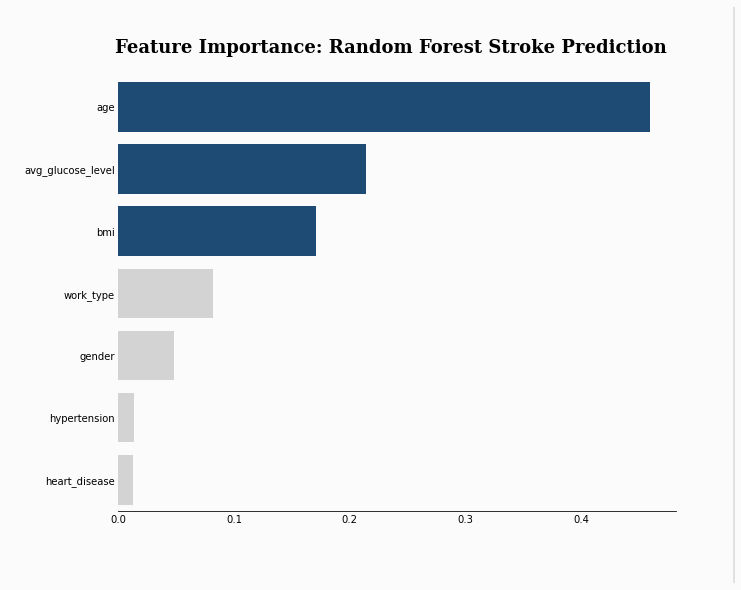

In [42]:
background_color = "#fbfbfb"

fig, ax = plt.subplots(1,1, figsize=(10, 8),facecolor=background_color)

color_map = ['lightgray' for _ in range(10)]
color_map[0] = color_map[1] = color_map[2] =  '#0f4c81' # color highlight

sns.barplot(data=fi,x='Importance',y='Feature',ax=ax,palette=color_map)
ax.set_facecolor(background_color) 
for s in ['top', 'left', 'right']:
    ax.spines[s].set_visible(False)
    
fig.text(0.12,0.92,"Feature Importance: Random Forest Stroke Prediction", fontsize=18, fontweight='bold', fontfamily='serif')

    
plt.xlabel(" ", fontsize=12, fontweight='light', fontfamily='serif',loc='left',y=-1.5)
plt.ylabel(" ", fontsize=12, fontweight='light', fontfamily='serif')



ax.tick_params(axis=u'both', which=u'both',length=0)


import matplotlib.lines as lines
l1 = lines.Line2D([0.98, 0.98], [0, 1], transform=fig.transFigure, figure=fig,color='black',lw=0.2)
fig.lines.extend([l1])


plt.show()

# SHAP



In [46]:
import shap  
rfc = RandomForestClassifier(max_features=3,n_estimators=175,bootstrap=False,criterion='gini')
rfc.fit(X_train_resh,y_train_resh)

explainer = shap.TreeExplainer(rfc)

shap_values = explainer.shap_values(X_test)


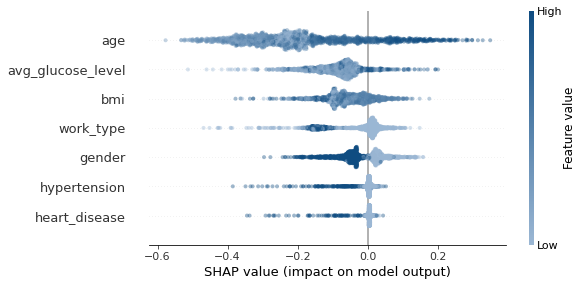

In [47]:
colors = ["#9bb7d4", "#0f4c81"]           
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
shap.summary_plot(shap_values[1], X_test,cmap=cmap,alpha=0.4)


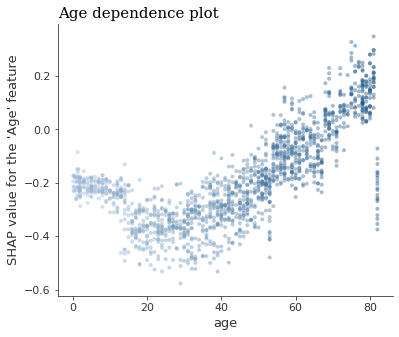

In [48]:

shap.dependence_plot('age', shap_values[1], X_test, interaction_index="age",cmap=cmap,alpha=0.4,show=False)
plt.title("Age dependence plot",loc='left',fontfamily='serif',fontsize=15)
plt.ylabel("SHAP value for the 'Age' feature")
plt.show()


Here we see a clear cutoff point for when strokes become far more common - after a BMI of around 30 or so.


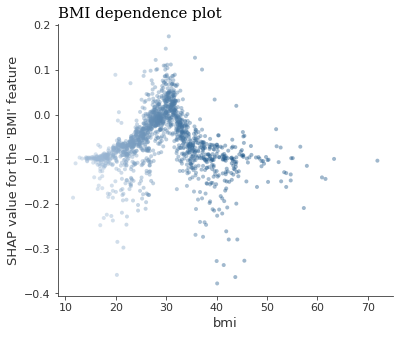

In [49]:
shap.dependence_plot('bmi', shap_values[1], X_test, interaction_index="bmi",cmap=cmap,alpha=0.4,show=False)
plt.title("BMI dependence plot",loc='left',fontfamily='serif',fontsize=15)
plt.ylabel("SHAP value for the 'BMI' feature")
plt.show()

# Logistic Regression with LIME


Lime stands for Local Interpretable Model-agnostic Explanations - here's an example:

In [50]:
import lime
import lime.lime_tabular

# LIME has one explainer for all the models
explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values, feature_names=X_test.columns.values.tolist(),
                                                  class_names=['no stroke','stroke'], verbose=True, mode='classification')

In [51]:
# Choose the jth instance and use it to predict the results for that selection
for j in range(0,10):
    exp = explainer.explain_instance(X_test.values[j], logreg_pipeline.predict_proba, num_features=7)
    exp.show_in_notebook(show_table=True)

Intercept 0.3213410526248242
Prediction_local [0.25226864]
Right: 0.20779100971173944


Intercept 0.25779385800059146
Prediction_local [0.27494398]
Right: 0.3205474612941081


Intercept 0.43035959166411436
Prediction_local [0.01542662]
Right: 0.029213065302129415


Intercept 0.256454284904692
Prediction_local [0.60841135]
Right: 0.7033582481953735


Intercept 0.19724230164598633
Prediction_local [0.66023056]
Right: 0.7106807775640768


Intercept 0.25202992823462683
Prediction_local [0.61709598]
Right: 0.7095012361165243


Intercept 0.34578351535891816
Prediction_local [0.35432524]
Right: 0.35529100870730956


Intercept 0.09775929045981452
Prediction_local [0.77718997]
Right: 0.7695210037680831


Intercept 0.3154804349941548
Prediction_local [0.11718704]
Right: 0.05200541255195725


Intercept 0.41500758460531006
Prediction_local [0.01329615]
Right: 0.018639766585628083


# We can also use ELI5 for feature explanation


Here we see the coefficient for each variable - in other words, what our Logistic model puts most value in.

In [52]:
import eli5

columns_ = ['gender', 'age', 'hypertension', 'heart_disease', 'work_type',
       'avg_glucose_level', 'bmi']

eli5.show_weights(logreg_pipeline.named_steps["LR"], feature_names=columns_)

Weight?,Feature
+1.436,age
+0.101,avg_glucose_level
-0.071,hypertension
-0.077,heart_disease
-0.341,gender
